<a href="https://colab.research.google.com/github/MohanZhu0623/Scalable-Logo-Recognition-Pipeline-with-Python_Mohan/blob/main/Scalable_Logo_Recognition_Pipeline_with_Python_Mohan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Environment Setup and Library Installation:
*   Installs the necessary Python libraries and clones the TensorFlow model repository.
*   Mounts Google Drive to access stored files and save results.

In [3]:
!pip install tensorflow --upgrade
!pip install tensorflow_hub
!pip install tensorflow_io
!git clone https://github.com/tensorflow/models.git
!apt-get install -y protobuf-compiler
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=.
!cp models/research/object_detection/packages/tf2/setup.py models/research/
!python -m pip install models/research/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 41.5 MB/s eta 0:00:00
Cloning into 'models'...
remote: Enumerating objects: 97985, done.
remote: Counting objects: 100% (499/499), done.
remote: Compressing objects: 100% (306/306), done.
remote: Total 97985 (delta 208), reused 444 (delta 176), pack-reused 97486 (from 1)
Receiving objects: 100% (97985/97985), 621.57 MiB | 45.47 MiB/s, done.
Resolving deltas: 100% (71195/71195), done.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
protobuf-compiler is already the newest version (3.12.4-1ubuntu7.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Processing ./models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━

In [4]:
import os
import cv2
import numpy as np
import tensorflow as tf
import csv
from tqdm import tqdm
import matplotlib.pyplot as plt
from object_detection.utils import label_map_util

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Set the correct paths for the model, label map, image folder, and output CSV files

In [6]:
# Set the correct paths
model_path = '/content/drive/MyDrive/logo_detection_model'
label_map_path = '/content/drive/MyDrive/flickr_logos_27_label_map.pbtxt'
image_folder_path = '/content/drive/MyDrive/flickr_logos_27_dataset_images/flickr_logos_27_dataset_images'
output_csv_first_batch = '/content/output_logo_detection_first_batch.csv'
output_csv_all = '/content/output_logo_detection_all.csv'

Function Definitions:


*   load_model: Loads a TensorFlow graph model from the specified path.
*   load_label_map: Loads the label map to convert class IDs into readable class names.
*   detect_logos_in_image: Detects logos in the input image and returns the bounding boxes, scores, classes, and number of detections.
*   save_detections_to_csv: Saves the detected logos and their confidence scores to a CSV file.
*   visualize_detections: Visualizes the detected logos on the image by drawing bounding boxes and labels.

In [7]:
def load_model(model_path):
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.compat.v1.GraphDef()
        with tf.io.gfile.GFile(model_path, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    return detection_graph

def load_label_map(label_map_path):
    label_map = label_map_util.load_labelmap(label_map_path)
    categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return category_index

def detect_logos_in_image(image_path, detection_graph):
    image = cv2.imread(image_path)
    image_expanded = np.expand_dims(image, axis=0)

    with detection_graph.as_default():
        with tf.compat.v1.Session(graph=detection_graph) as sess:
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')

            (boxes, scores, classes, num) = sess.run(
                [detection_boxes, detection_scores, detection_classes, num_detections],
                feed_dict={image_tensor: image_expanded})

            return boxes, scores, classes, num

def save_detections_to_csv(output_csv, image_names, scores, classes, category_index, threshold=0.5):
    with open(output_csv, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Image Name', 'Logo Class', 'Confidence Score'])

        for i in range(len(image_names)):
            # Extract scores and classes for the current image
            image_scores = np.squeeze(scores[i])
            image_classes = np.squeeze(classes[i])

            if len(image_scores) == 0:  # If no scores were detected
                writer.writerow([image_names[i], 'NA', 'NA'])
                continue

            # Find the highest score and check if it's above the threshold
            max_score_idx = np.argmax(image_scores)
            max_score = image_scores[max_score_idx]

            if max_score > threshold:
                class_id = int(image_classes[max_score_idx])
                label = category_index.get(class_id, {'name': 'N/A'})['name']
                writer.writerow([image_names[i], label, max_score])
            else:
                writer.writerow([image_names[i], 'NA', 'NA'])


def visualize_detections(image, boxes, scores, classes, category_index, threshold=0.5):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image_rgb.shape

    plt.figure(figsize=(12, 8))
    plt.imshow(image_rgb)

    for i in range(len(boxes)):
        if scores[i] > threshold:
            box = boxes[i]
            class_id = int(classes[i])
            label = category_index[class_id]['name'] if class_id in category_index else 'N/A'
            ymin, xmin, ymax, xmax = box
            (left, right, top, bottom) = (xmin * w, xmax * w, ymin * h, ymax * h)
            plt.gca().add_patch(plt.Rectangle((left, top), right - left, bottom - top,
                                              edgecolor='red', facecolor='none', linewidth=2))
            plt.text(left, top - 10, f'{label}: {scores[i]:.2f}', color='red', fontsize=12)

    plt.axis('off')
    plt.show()

Processing Images and Saving Results:
*   Loads the model and label map.
*   Retrieves the list of image files.
*   Processes the first batch of images, saves the detection results to a CSV file, and downloads the file.
*   Visualizes the detection results for the first batch of images.
*   Processes all images and saves the detection results to another CSV file.





In [8]:
# Load the model and label map
detection_graph = load_model(model_path)
category_index = load_label_map(label_map_path)

# Get the list of image files
image_files = [file for file in os.listdir(image_folder_path) if file.endswith('.jpg')]
batch_size = 20

# Process the first batch of images and save the results to the CSV file
first_batch_files = image_files[:batch_size]
image_batch = [cv2.imread(os.path.join(image_folder_path, file)) for file in first_batch_files]

In [16]:
# Initialize lists to collect the results for the batch
all_boxes, all_scores, all_classes = [], [], []

for image_file in tqdm(first_batch_files):
    image_path = os.path.join(image_folder_path, image_file)
    boxes, scores, classes, num = detect_logos_in_image(image_path, detection_graph)
    all_boxes.append(boxes)
    all_scores.append(scores)
    all_classes.append(classes)

# Save results to the first batch CSV
save_detections_to_csv(output_csv_first_batch, first_batch_files, all_scores, all_classes, category_index, threshold=0.5)
print(f"First batch logo detection completed. Results saved to {output_csv_first_batch}.")

100%|██████████| 20/20 [01:11<00:00,  3.55s/it]

First batch logo detection completed. Results saved to /content/output_logo_detection_first_batch.csv.


In [17]:
from google.colab import files

files.download(output_csv_first_batch)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

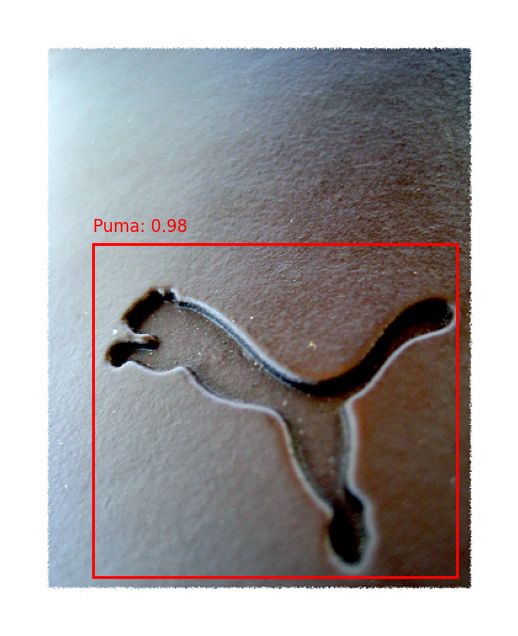

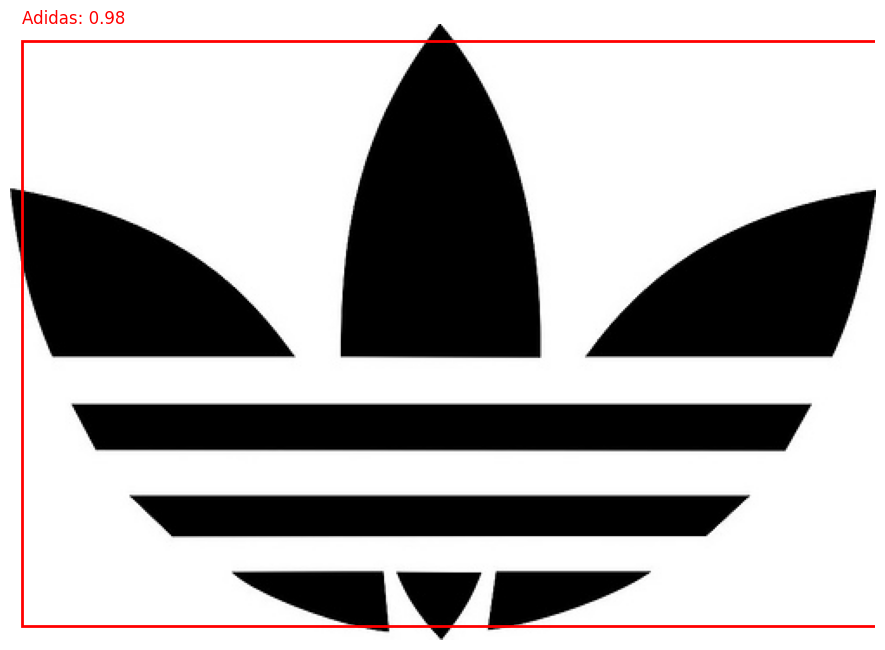

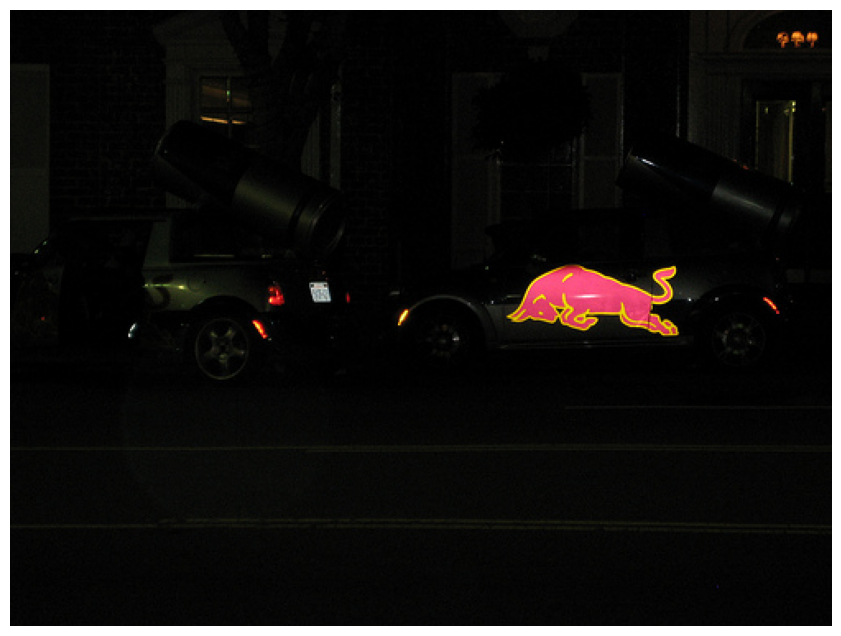

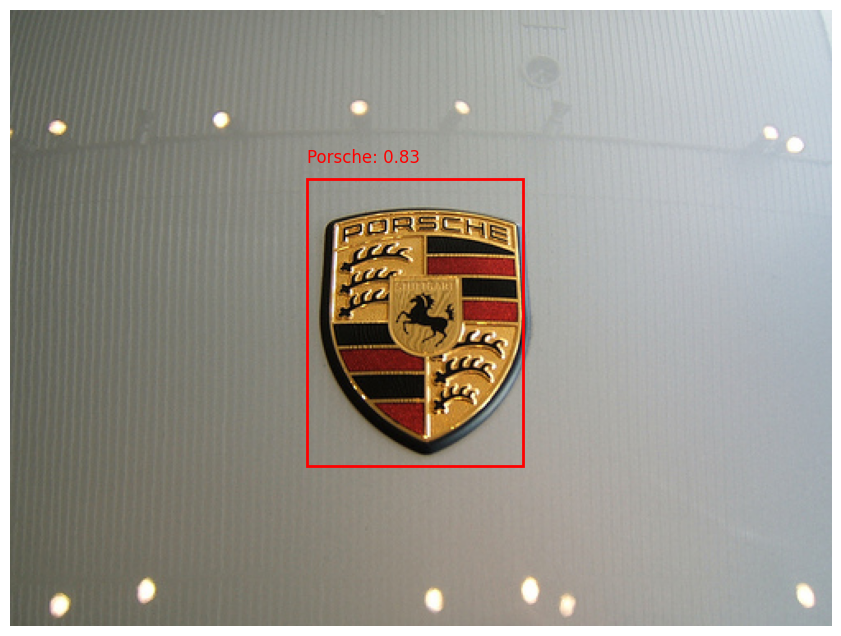

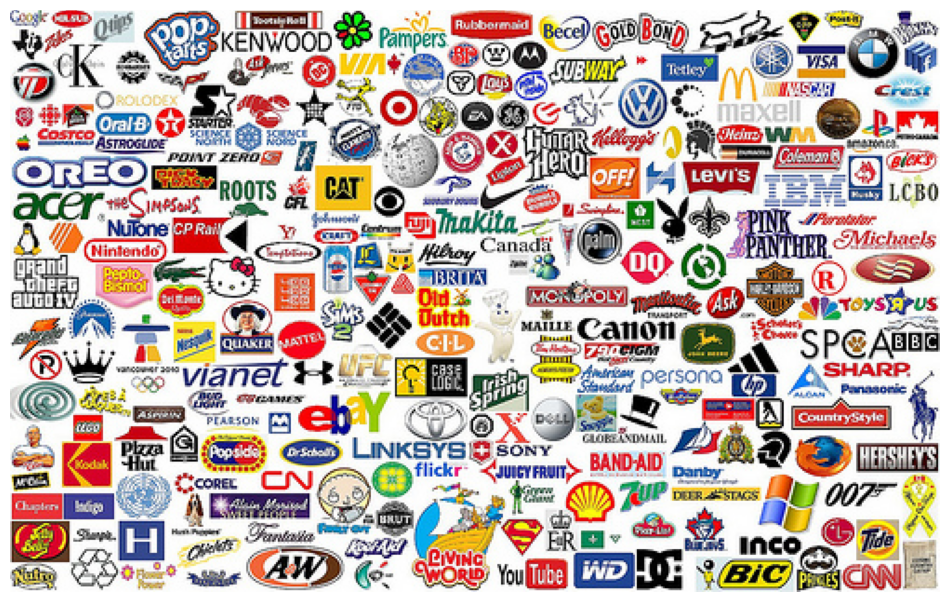

...

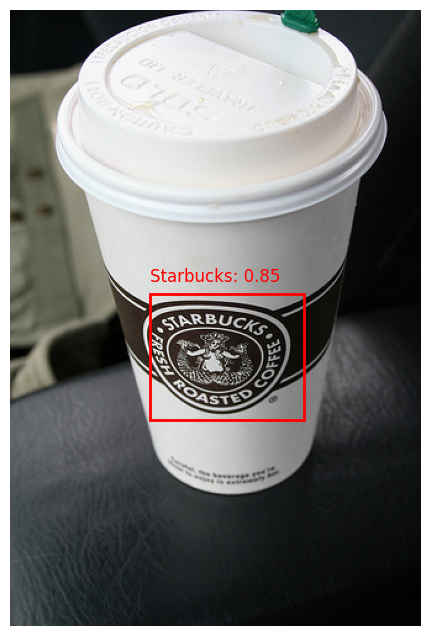

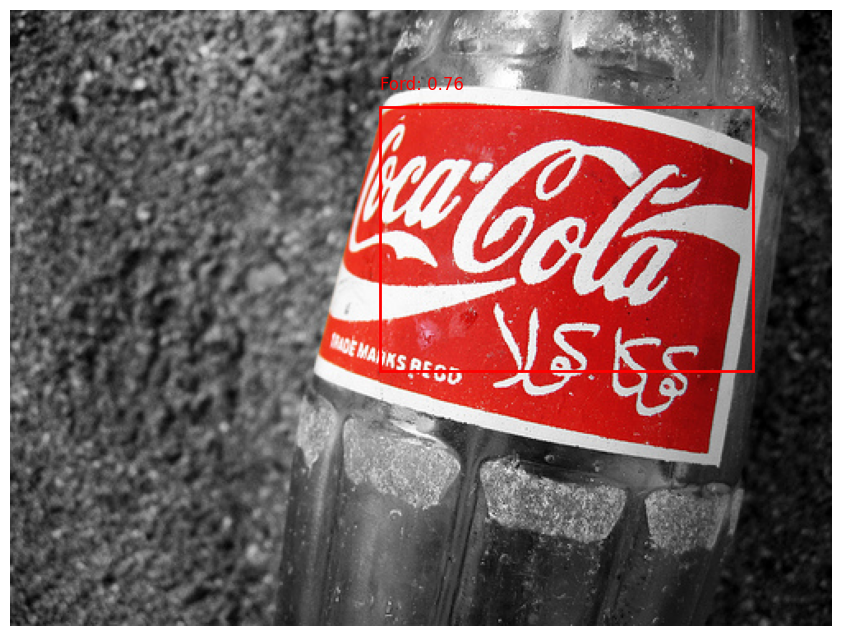

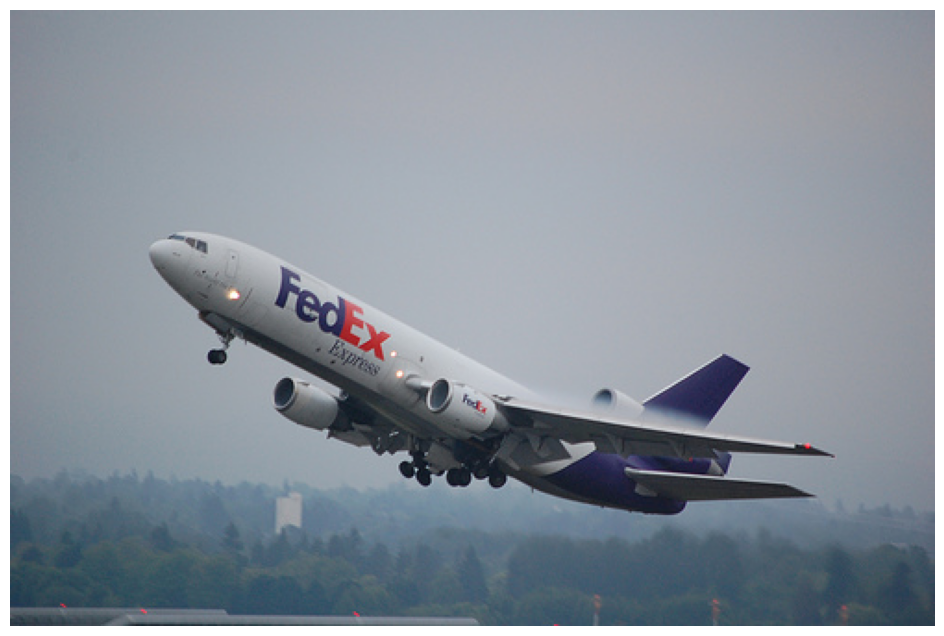

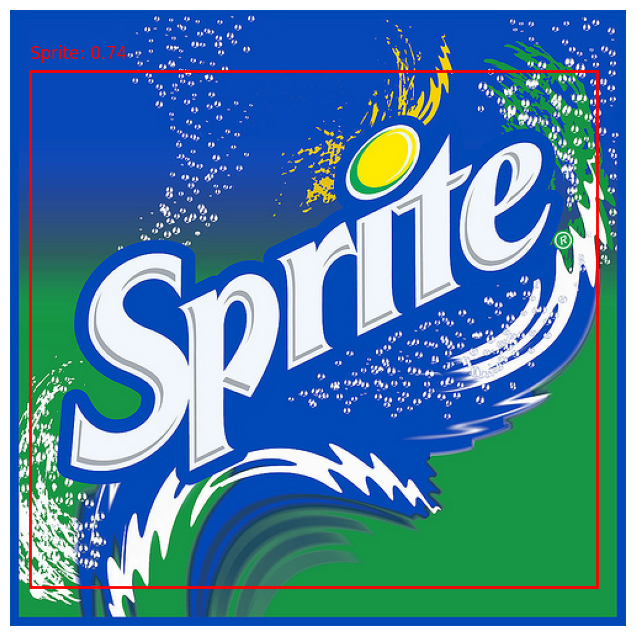

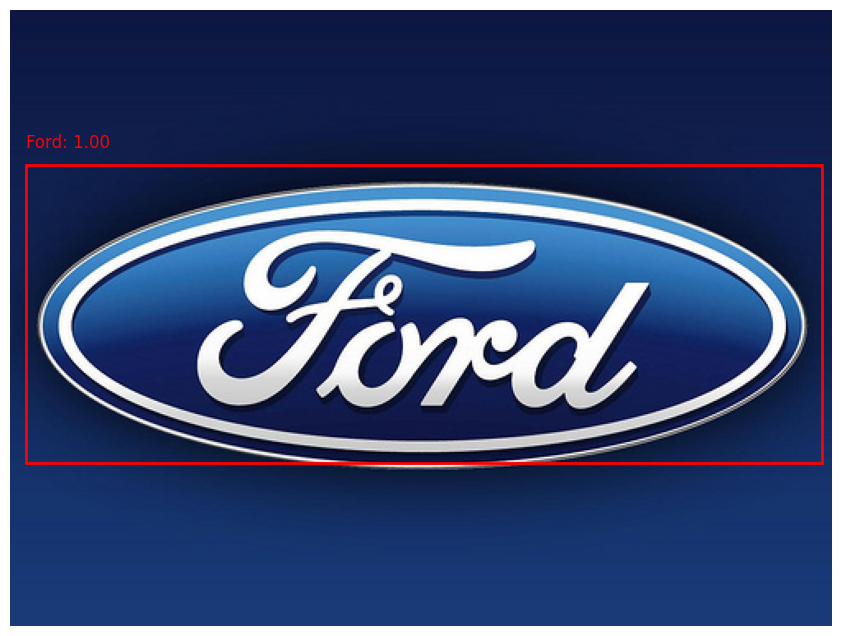

In [18]:
# Visualize detections for the first batch of images
for image_file, boxes, scores, classes in zip(image_batch, all_boxes, all_scores, all_classes):
    visualize_detections(image_file, np.squeeze(boxes), np.squeeze(scores), np.squeeze(classes), category_index, threshold=0.5)

In [ ]:
from google.colab import files

files.download(output_csv_first_batch)

In [21]:
# Define the batch size and calculate the number of images to process (10 batches)
batch_size = 20  # Example batch size, adjust as necessary
num_batches = 10
num_images_to_process = batch_size * num_batches

# Initialize lists to collect the results for all images in the first 10 batches
all_scores, all_classes = [], []

# Process only the first 10 batches of images
for image_file in tqdm(image_files[:num_images_to_process]):
    image_path = os.path.join(image_folder_path, image_file)
    boxes, scores, classes, num = detect_logos_in_image(image_path, detection_graph)
    all_scores.append(scores)
    all_classes.append(classes)

# Save results to the CSV for the first 10 batches
output_csv_2024 = '/content/output_logo_detection_2024.csv'
save_detections_to_csv(output_csv_2024, image_files[:num_images_to_process], all_scores, all_classes, category_index, threshold=0.5)
print(f"Logo detection for first 10 batches completed. Results saved to {output_csv_2024}.")

100%|██████████| 200/200 [11:54<00:00,  3.57s/it]

Logo detection for first 10 batches completed. Results saved to /content/output_logo_detection_2024.csv.


In [22]:
# Download the generated CSV file
from google.colab import files
files.download(output_csv_2024)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>